# Image Classification: Dogs and Cats

In [2]:
# import libraries
import pandas as pd
import numpy as np
import os
import cv2

# to make this notebook's output stable across runs
np.random.seed(42)

import matplotlib
import matplotlib.pyplot as plt

# display multiple outputs within a cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all";

import warnings
warnings.filterwarnings('ignore')

# Load data and plot some images

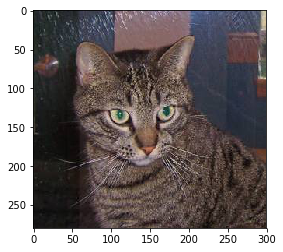

In [3]:
# training data given just as jpeg image files
import matplotlib.image as img
image = img.imread("C:/Users/1394852/Desktop/ml_project/dogs_cats/cat.1.jpg")
plt.imshow(image)

# pixel height, width
image.shape;

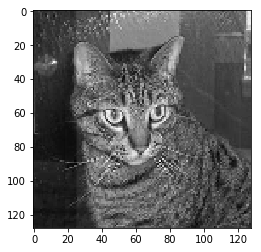

In [4]:
image = cv2.imread("C:/Users/1394852/Desktop/ml_project/dogs_cats/cat.1.jpg")
image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
res = cv2.resize(image, dsize=(128, 128), interpolation=cv2.INTER_CUBIC)
plt.imshow(res,cmap='gray')
plt.show();

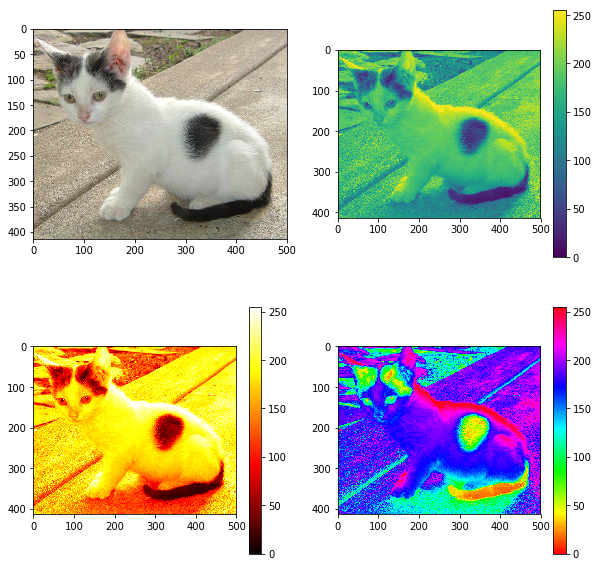

In [5]:
image2 = img.imread("C:/Users/1394852/Desktop/ml_project/dogs_cats/cat.3.jpg")
# pixel height = 414, pixel width = 500, each inner 3-length list is one pixel
image2.shape

# convert to grayscale and plot with different colormaps
lum_img = image2[:,:,0]

plt.figure(figsize=(10,10))
plt.subplot(2, 2, 1)
plt.imshow(image2)
plt.subplot(2, 2, 2)
plt.imshow(lum_img)
plt.colorbar()
plt.subplot(2, 2, 3)
plt.imshow(lum_img, cmap = 'hot')
plt.colorbar()
plt.subplot(2, 2, 4)
plt.imshow(lum_img, cmap = 'hsv')
plt.colorbar()
plt.show();

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


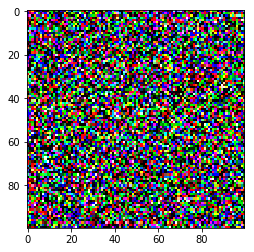

In [6]:
# plotting randomly generated pixel values and displaying as an image
test_img = np.random.randn(100, 100, 3)
plt.imshow(test_img);

In [7]:
# Load image files, add labels, and resize so they all images have same size
IMG_SIZE = 128
DIR = "C:/Users/1394852/Desktop/ml_project/dogs_cats/train"
from PIL import Image

def load_training_data():
  train_data = []
  for img in os.listdir(DIR):
    label = img[:3]
    if label == 'cat':
        label = 0
    else:
        label = 1
    path = os.path.join(DIR, img)
    img = Image.open(path)
    img = img.resize((IMG_SIZE, IMG_SIZE), Image.ANTIALIAS)
    train_data.append([np.array(img), label])

  
  return train_data

def get_size_statistics(DIR):
  heights = []
  widths = []
  for img in os.listdir(DIR): 
    path = os.path.join(DIR, img)
    data = np.array(Image.open(path)) #PIL Image library
    heights.append(data.shape[0])
    widths.append(data.shape[1])
  avg_height = sum(heights) / len(heights)
  avg_width = sum(widths) / len(widths)
  print("Average Height: " + str(avg_height))
  print("Max Height: " + str(max(heights)))
  print("Min Height: " + str(min(heights)))
  print('\n')
  print("Average Width: " + str(avg_width))
  print("Max Width: " + str(max(widths)))
  print("Min Width: " + str(min(widths)))

In [8]:
train_data = load_training_data()
#get_size_statistics(DIR)

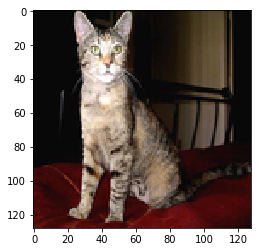

In [9]:
# set array of labels and the data (pixel values for the images)
train_data = np.array(train_data)
train_data.shape
labels = train_data[:,1]
data = train_data[:,0]

# examine image from train data 
image3 = train_data[5][0]
plt.imshow(image3);

In [10]:
# convert RGB values to grayscale
for i in range(len(data)):
    data[i] = cv2.cvtColor(data[i], cv2.COLOR_BGR2GRAY)

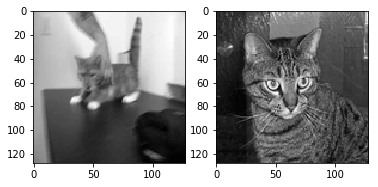

In [11]:
plt.subplot(1, 2, 1)
plt.imshow(data[0], cmap='gray')
plt.subplot(1, 2, 2)
plt.imshow(data[1], cmap='gray');

In [12]:
# only use first 100 rows (cat images) to test
X = np.array([x for x in data[:100]])
X = X.reshape(100, 16384)

# Principal Component Analysis

We have data that is very high dimensional, so let's try some dimensionality reduction methods <br>
<br>
We use PCA and find the cumulative explained variance as we increase the number of principal components <br>
<br>
We do this separately for the set of all cats and the set of all dogs to examine variance and the structure of the higher dimensional data within classes

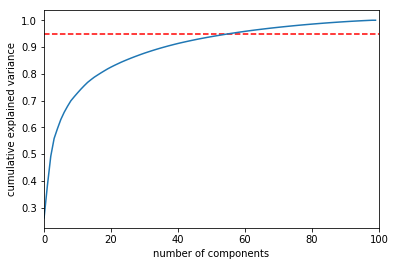

In [13]:
# explained variance from principal components
from sklearn.decomposition import PCA
model = PCA(svd_solver = 'randomized')
proj = model.fit_transform(X)
cumsum = np.cumsum(model.explained_variance_ratio_)
d = np.argmax(cumsum >= 0.95) + 1
plt.plot((0, 800), (0.95, 0.95), 'r--')
plt.plot(cumsum)
plt.xlim(0,100)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

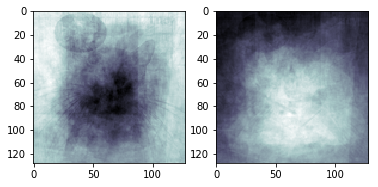

In [14]:
# plot some principal components
model.components_[0].shape
plt.subplot(1, 2, 1)
plt.imshow(model.components_[0].reshape(128,128), cmap = 'bone')
plt.subplot(1, 2, 2)
plt.imshow(model.components_[1].reshape(128,128), cmap = 'bone');

We can see some features of a cat in the first two principal components

# Manifold Learning for Non-Linear Dimensionality Reduction

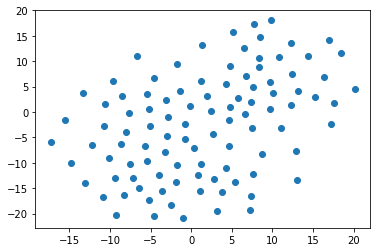

In [15]:
# apply TSNE to reduce to 2 dimensions and attempt to visualize
from sklearn.manifold import TSNE

model = TSNE(n_components=2)
proj = model.fit_transform(X)
plt.scatter(proj[:, 0], proj[:, 1]);

In [16]:
# function to plot images on scatterplot
from matplotlib import offsetbox

def plot_components(data, model, images=None, ax=None,
                    thumb_frac=0.05, cmap='gray'):
    ax = ax or plt.gca()
    
    proj = model.fit_transform(data)
    ax.plot(proj[:, 0], proj[:, 1], '.k')
    
    if images is not None:
        min_dist_2 = (thumb_frac * max(proj.max(0) - proj.min(0))) ** 2
        shown_images = np.array([2 * proj.max(0)])
        for i in range(data.shape[0]):
            dist = np.sum((proj[i] - shown_images) ** 2, 1)
            if np.min(dist) < min_dist_2:
                # don't show points that are too close
                continue
            shown_images = np.vstack([shown_images, proj[i]])
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(images[i], cmap=cmap),
                                      proj[i])
            ax.add_artist(imagebox);

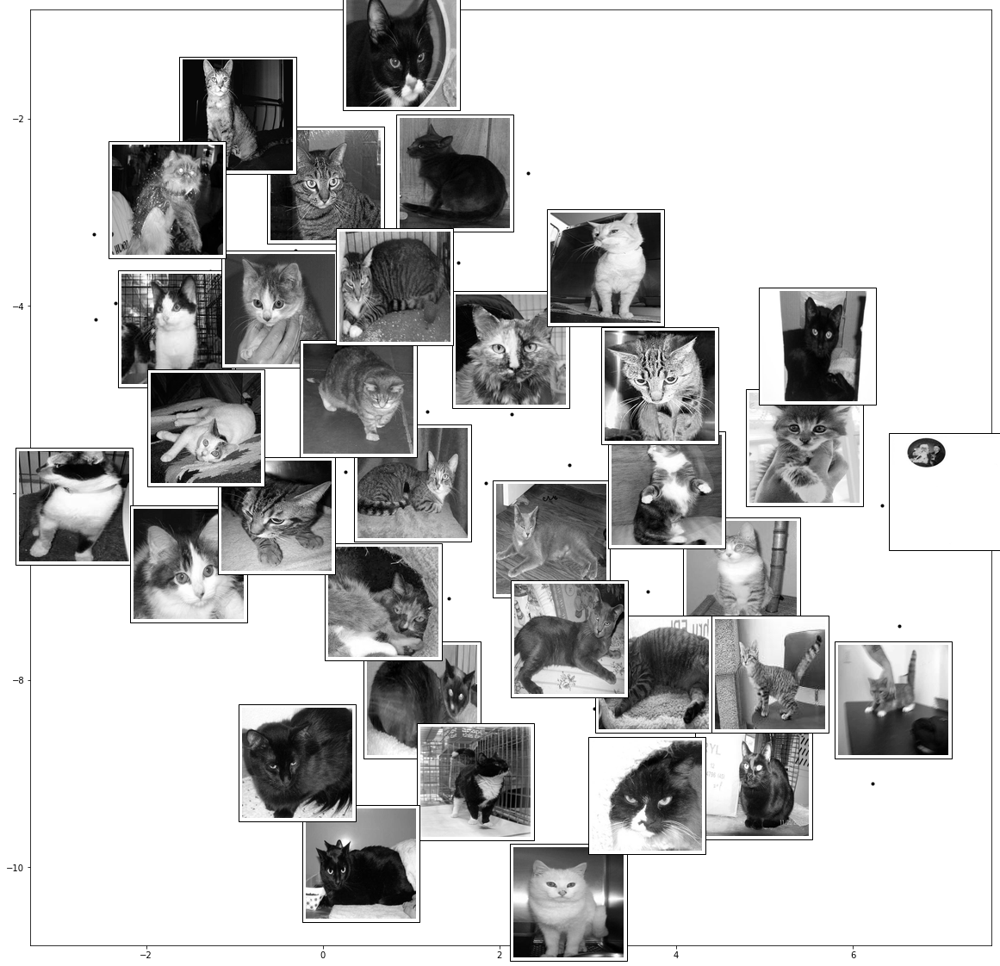

In [17]:
# add images to lower dimensional data and try to visualize clustering or separation based on features of the images
fig, ax = plt.subplots(figsize=(20, 20))

model = TSNE(n_components=2)
plot_components(X, model, images=X.reshape((100, 128, 128)),
                ax=ax, thumb_frac=0.1, cmap='gist_gray')

It seems that the images are darker in the top right and so that might represent some of the higher dimensional structure preserved in this lower dimensional embedding

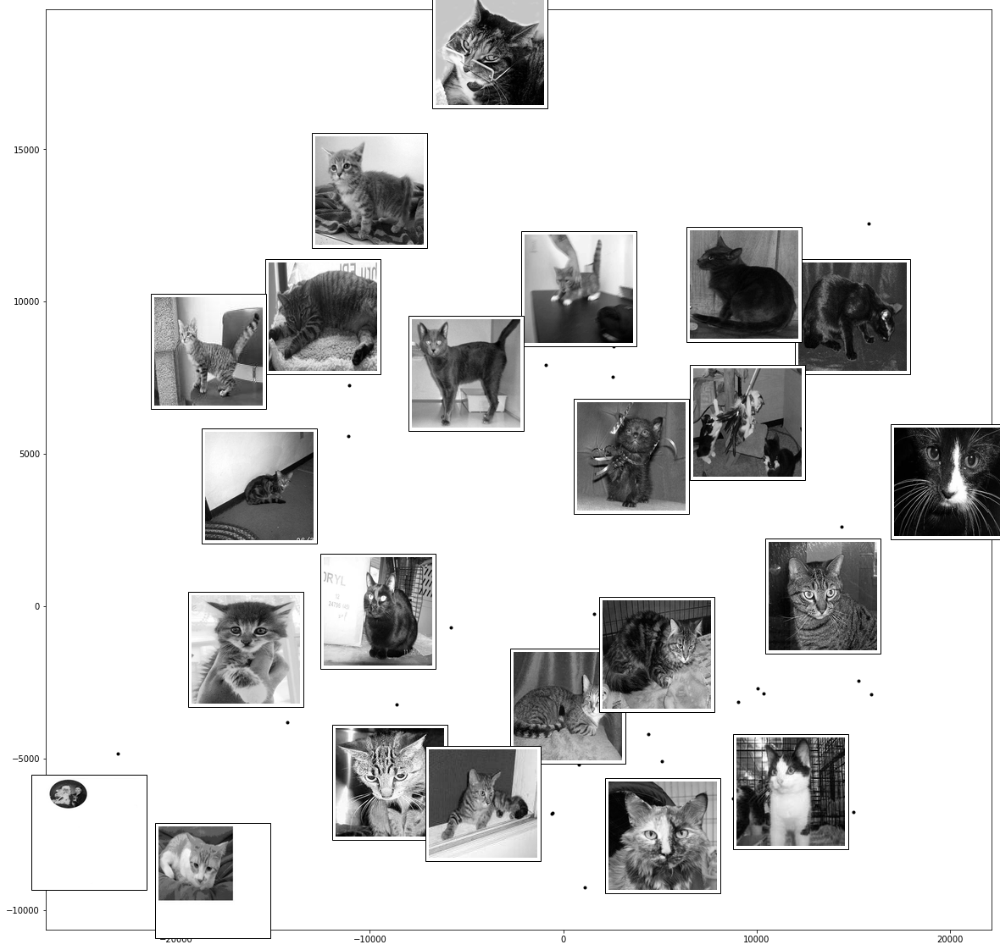

In [18]:
# apply Isomap to reduce to 2 dimensions and attempt to visualize
from sklearn.manifold import Isomap

fig, ax = plt.subplots(figsize=(20, 20))
model = Isomap(n_neighbors=5, n_components=2, eigen_solver='dense')
plot_components(X, model, images=X.reshape((100, 128, 128)),
                ax=ax, thumb_frac=0.1, cmap='gist_gray')

In this case it seems images with higher pixel intensity are clustered in the bottom right, and there's a few outliers or possibly garbage values as well <br>
<br>
Let's look at some pups now

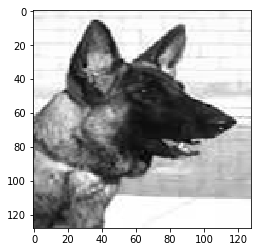

In [19]:
X_dogs = np.array([x for x in data[-100:]])
X_dogs = X_dogs.reshape(100, 16384)
plt.imshow(X_dogs[-1].reshape(128,128), cmap = 'gist_gray');

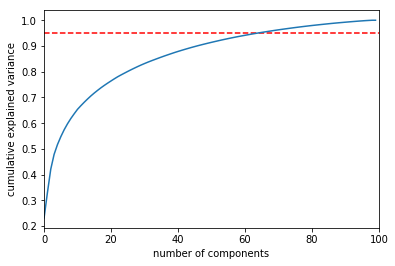

In [20]:
# explained variance from principal components
from sklearn.decomposition import PCA
model = PCA(svd_solver = 'randomized')
proj = model.fit_transform(X_dogs)
cumsum = np.cumsum(model.explained_variance_ratio_)
d = np.argmax(cumsum >= 0.95) + 1
plt.plot((0, 800), (0.95, 0.95), 'r--')
plt.plot(cumsum)
plt.xlim(0,100)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

It looks like the dogs have greater variance along more components than the cats 

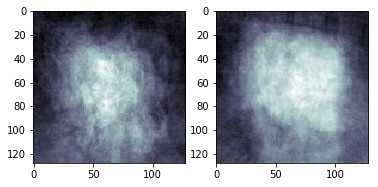

In [21]:
plt.subplot(1, 2, 1)
plt.imshow(model.components_[0].reshape(128,128), cmap = 'bone')
plt.subplot(1, 2, 2)
plt.imshow(model.components_[1].reshape(128,128), cmap = 'bone');

Note that PCA can sometimes suggest anomalies in the data

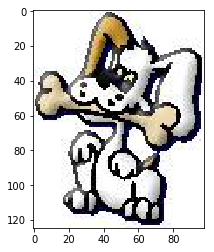

In [22]:
# strange image in train data
img_dog = img.imread("C:/Users/1394852/Desktop/ml_project/dogs_cats/dog.9188.jpg")
plt.imshow(img_dog);

We'll need to perform anomaly detection to clean up outlier images like this one

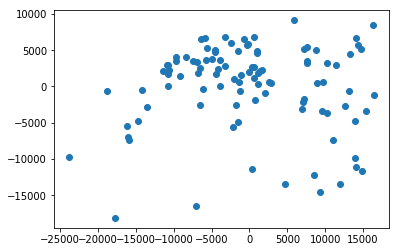

In [23]:
# apply TSNE or Isomap to reduce to 2 dimensions and attempt to visualize
from sklearn.manifold import TSNE
from sklearn.manifold import Isomap

model = Isomap(n_components=2, n_neighbors = 5)
proj = model.fit_transform(X_dogs)
plt.scatter(proj[:, 0], proj[:, 1]);

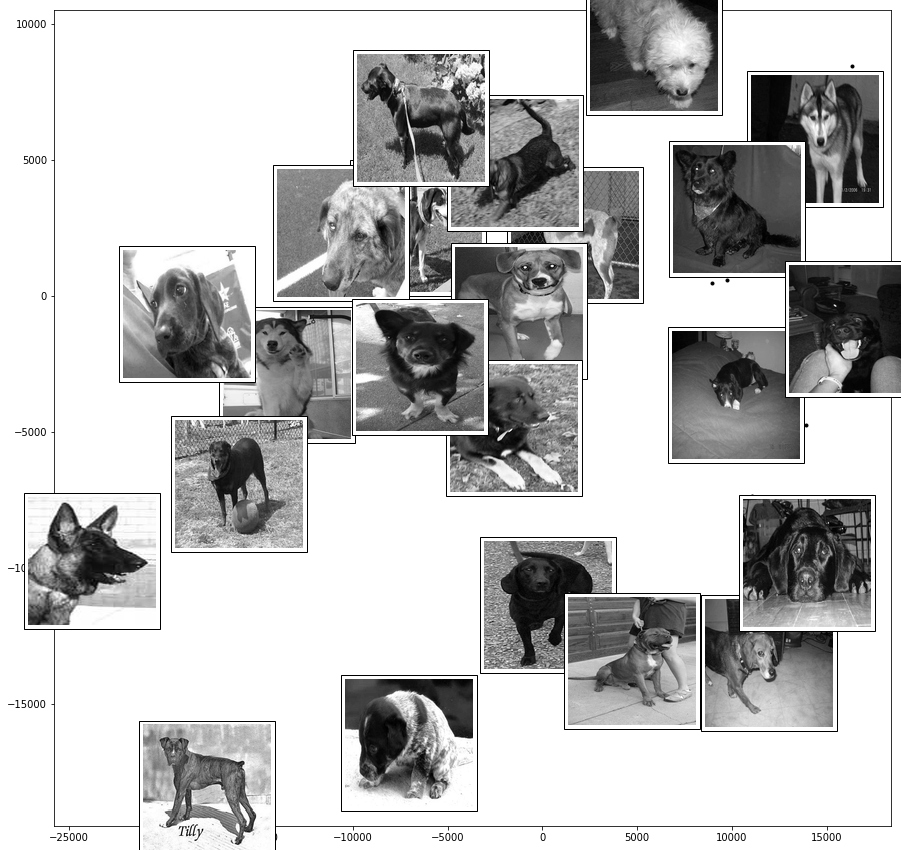

In [24]:
# add images to lower dimensional data and try to visualize clustering or separation based on features of the images
fig, ax = plt.subplots(figsize=(15, 15))

plot_components(X_dogs, model, images=X_dogs.reshape((100, 128, 128)),
                ax=ax, thumb_frac=0.1, cmap='gist_gray')

This shows an outlier at the bottom left that has text within the image

Now try PCA for data with both classes to try and get a sense of the structure of the high dimensional data

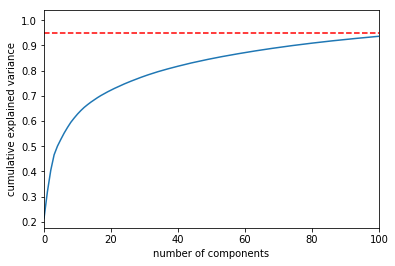

In [25]:
X = np.array([x for x in data[12400:12600]])
X = X.reshape(200, 16384)

# explained variance from principal components
from sklearn.decomposition import PCA
model = PCA(svd_solver = 'randomized')
proj = model.fit_transform(X)
cumsum = np.cumsum(model.explained_variance_ratio_)
d = np.argmax(cumsum >= 0.95) + 1
plt.plot((0, 800), (0.95, 0.95), 'r--')
plt.plot(cumsum)
plt.xlim(0,100)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

Although each data point is a 128 x 128 pixel image, or a 16384 dimensional vector, but with around 100 dimensions/components we can preserve around 90% of the data's variance

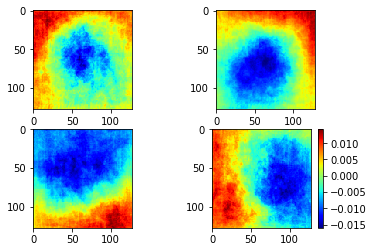

In [26]:
plt.subplot(2, 2, 1)
plt.imshow(model.components_[0].reshape(128,128), cmap = 'jet')
plt.subplot(2, 2, 2)
plt.imshow(model.components_[1].reshape(128,128), cmap = 'jet');
plt.subplot(2, 2, 3)
plt.imshow(model.components_[2].reshape(128,128), cmap = 'jet');
plt.subplot(2, 2, 4)
plt.imshow(model.components_[3].reshape(128,128), cmap = 'jet');
plt.colorbar();

We can see different regions that account for the most variance, including the background, illumination, and scenes in the side of the images

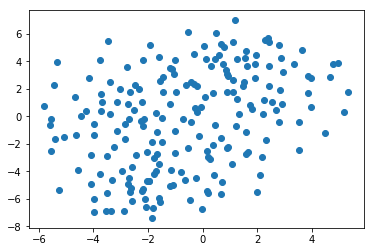

In [27]:
# apply non-linear embedding to reduce to 2 dimensions and attempt to visualize
from sklearn.manifold import TSNE
from sklearn.manifold import SpectralEmbedding

model = TSNE(n_components=2)
proj = model.fit_transform(X)
plt.scatter(proj[:, 0], proj[:, 1]);

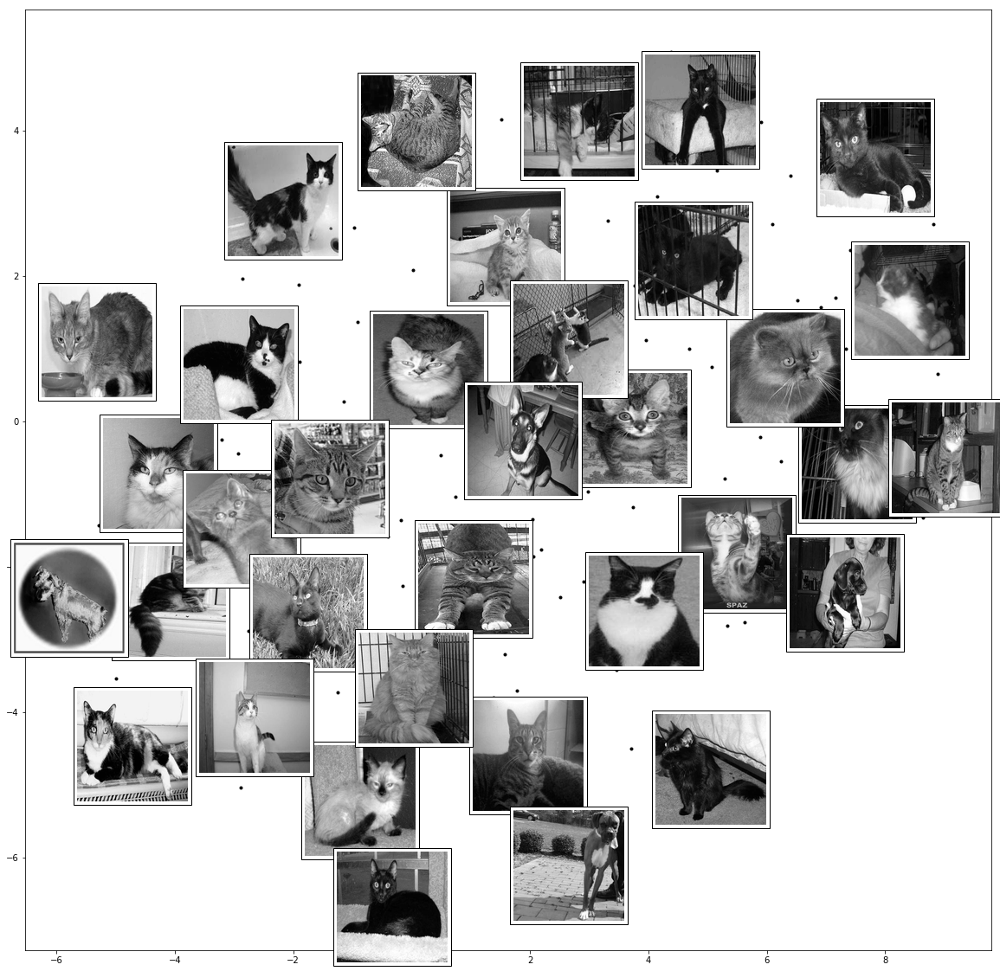

In [28]:
# add images to lower dimensional data and try to visualize clustering or separation based on features of the images
fig, ax = plt.subplots(figsize=(20, 20))

plot_components(X, model, images=X.reshape((200, 128, 128)),
                ax=ax, thumb_frac=0.1, cmap='gist_gray');

This shows a good amount of some variance in the data, we see some outliers and possible data problems with text annotations, as well as the different ways these images can vary.

# Data Augmentation

We generate some modified versions of train images to make sure our model sees enough data and secondly that it is invariant to small changes like rotation or camera angles.

From the example images we find different camera angles, backgrounds, orientation of the animal, color intensity, and randomness added like text, people in the background, multiple cats per image, etc.

In [29]:
from skimage.transform import warp, AffineTransform, ProjectiveTransform
from skimage.exposure import equalize_adapthist, equalize_hist, rescale_intensity, adjust_gamma, adjust_log, adjust_sigmoid
from skimage.filters import gaussian
from skimage.util import random_noise
import random

# Affine transformation (rotation, scaling, translation)
def randRange(a, b):
    '''
    a utility function to generate random float values in desired range
    '''
    return np.random.rand() * (b - a) + a


def randomAffine(im):
    '''
    wrapper of Affine transformation with random scale, rotation, shear and translation parameters
    '''
    tform = AffineTransform(scale=(randRange(0.75, 1.3), randRange(0.75, 1.3)),
                            rotation=randRange(-0.25, 0.25),
                            shear=randRange(-0.2, 0.2),
                            translation=(randRange(-im.shape[0]//10, im.shape[0]//10), 
                                         randRange(-im.shape[1]//10, im.shape[1]//10)))
    return warp(im, tform.inverse, mode='reflect')

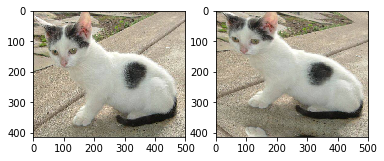

In [30]:
cat_3 = matplotlib.image.imread("C:/Users/1394852/Desktop/ml_project/dogs_cats/cat.3.jpg")
randomAffine(cat_3).shape
plt.subplot(1, 2, 1)
plt.imshow(cat_3)
plt.subplot(1, 2, 2)
plt.imshow(randomAffine(cat_3));

In [31]:
def randomPerspective(im):
    '''
    wrapper of Projective (or perspective) transform, from 4 random points selected from 4 corners of the image 
    within a defined region.
    '''
    region = 1/4
    A = np.array([[0, 0], [0, im.shape[0]], [im.shape[1], im.shape[0]], [im.shape[1], 0]])
    B = np.array([[int(randRange(0, im.shape[1] * region)), int(randRange(0, im.shape[0] * region))], 
                  [int(randRange(0, im.shape[1] * region)), int(randRange(im.shape[0] * (1-region), im.shape[0]))], 
                  [int(randRange(im.shape[1] * (1-region), im.shape[1])), int(randRange(im.shape[0] * (1-region), im.shape[0]))], 
                  [int(randRange(im.shape[1] * (1-region), im.shape[1])), int(randRange(0, im.shape[0] * region))], 
                 ])

    pt = ProjectiveTransform()
    pt.estimate(A, B)
    return warp(im, pt, output_shape=im.shape[:2])

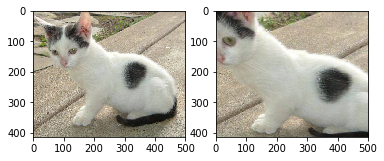

In [32]:
plt.subplot(1, 2, 1)
plt.imshow(cat_3)
plt.subplot(1, 2, 2)
plt.imshow(randomPerspective(cat_3));

In [33]:
def randomCrop(im):
    '''
    croping the image in the center from a random margin from the borders
    '''
    margin = 1/10
    start = [int(randRange(0, im.shape[0] * margin)),
             int(randRange(0, im.shape[1] * margin))]
    end = [int(randRange(im.shape[0] * (1-margin), im.shape[0])), 
           int(randRange(im.shape[1] * (1-margin), im.shape[1]))]
    return im[start[0]:end[0], start[1]:end[1]]


def randomIntensity(im):
    '''
    rescales the intesity of the image to random interval of image intensity distribution
    '''
    return rescale_intensity(im,
                             in_range=tuple(np.percentile(im, (randRange(0,10), randRange(90,100)))),
                             out_range=tuple(np.percentile(im, (randRange(0,10), randRange(90,100)))))

def randomGamma(im):
    '''
    Gamma filter for contrast adjustment with random gamma value.
    '''
    return adjust_gamma(im, gamma=randRange(0.5, 1.5))

def randomGaussian(im):
    '''
    Gaussian filter for bluring the image with random variance.
    '''
    return gaussian(im, sigma=randRange(0, 5))
    
def randomFilter(im):
    '''
    randomly selects an exposure filter from histogram equalizers, contrast adjustments, 
    and intensity rescaler and applys it on the input image.
    filters include: equalize_adapthist, equalize_hist, rescale_intensity, adjust_gamma, 
    adjust_log, adjust_sigmoid, gaussian
    '''
    Filters = [equalize_adapthist, equalize_hist, adjust_log, adjust_sigmoid, randomGamma, 
               randomGaussian, randomIntensity]
    filt = random.choice(Filters)
    return filt(im)


def randomNoise(im):
    '''
    random gaussian noise with random variance.
    '''
    var = randRange(0.001, 0.01)
    return random_noise(im, var=var)

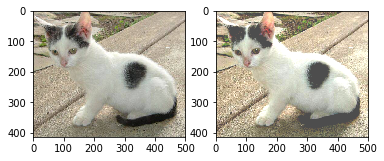

In [34]:
# random intensity
plt.subplot(1, 2, 1)
plt.imshow(cat_3)
plt.subplot(1, 2, 2)
plt.imshow(randomIntensity(cat_3));

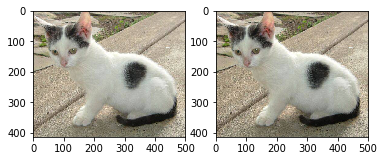

In [35]:
# random gamma (contrast)
plt.subplot(1, 2, 1)
plt.imshow(cat_3)
plt.subplot(1, 2, 2)
plt.imshow(randomGamma(cat_3));

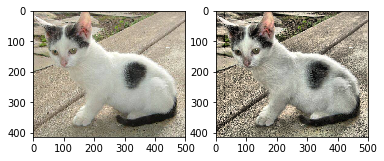

In [36]:
# random filter
plt.subplot(1, 2, 1)
plt.imshow(cat_3)
plt.subplot(1, 2, 2)
plt.imshow(randomFilter(cat_3));

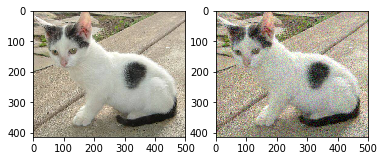

In [37]:
# random noise (blurring)
plt.subplot(1, 2, 1)
plt.imshow(cat_3)
plt.subplot(1, 2, 2)
plt.imshow(randomNoise(cat_3));

In [38]:
def augment(im, Steps=[randomAffine, randomPerspective, randomFilter, randomNoise, randomCrop]):
    '''
    image augmentation by doing a sereis of transfomations on the image.
    '''
    for step in Steps:
        im = step(im)
    return im

Text(0.5,1,'original$\\rightarrow$')

Text(0.5,1,'randomAffine$\\rightarrow$')

Text(0.5,1,'randomPerspective$\\rightarrow$')

Text(0.5,1,'randomFilter$\\rightarrow$')

Text(0.5,1,'randomNoise$\\rightarrow$')

Text(0.5,1,'randomCrop')

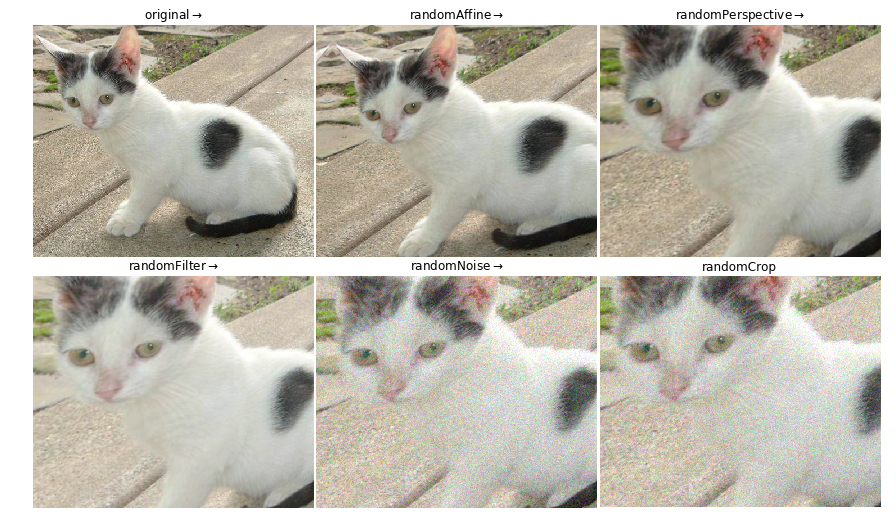

In [39]:
import matplotlib.gridspec as gridspec
import itertools

im = cat_3
F = plt.figure(figsize=(12,8))
G = plt.GridSpec(2, 3, left=.01, right=.99, bottom=0.05, top=0.9, wspace=.01, 
                 hspace=0.05, figure=F);
ax = plt.subplot(G[0]);
ax.imshow(im);
ax.set_axis_off();
ax.set_aspect('equal');
ax.set_title('original' + r'$\rightarrow$');
for i, step in enumerate([randomAffine, randomPerspective, randomFilter, randomNoise, 
                          randomCrop]):
    ax = plt.subplot(G[i+1]);
    im = step(im);
    ax.imshow(im);
    ax.set_axis_off();
    ax.set_aspect('equal');
    ax.set_title(step.__name__ + (r'$\rightarrow$' if i < 4 else ''));

Text(0.5,1,'original')

Text(0.5,1,'equalize_adapthist on (original)')

Text(0.5,1,'equalize_hist on (original)')

Text(0.5,1,'adjust_log on (original)')

Text(0.5,1,'adjust_sigmoid on (original)')

Text(0.5,1,'randomGamma on (original)')

Text(0.5,1,'randomGaussian on (original)')

Text(0.5,1,'randomIntensity on (original)')

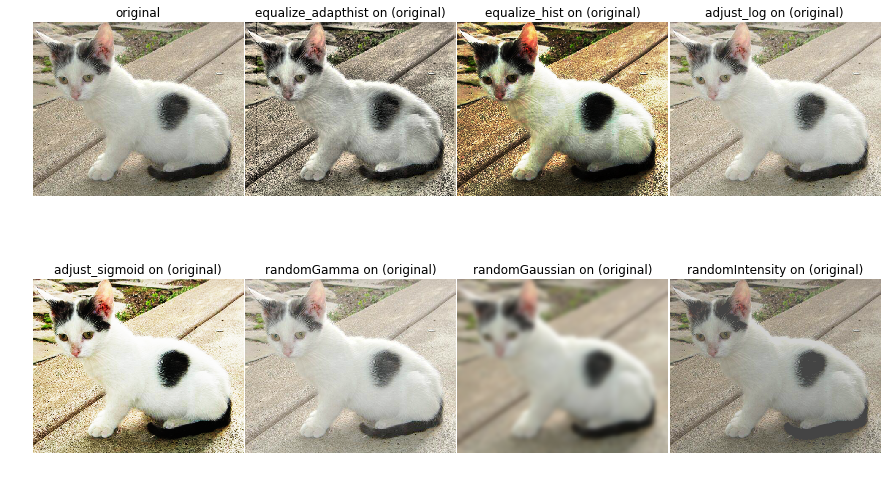

In [40]:
F = plt.figure(figsize=(12,8))
G = plt.GridSpec(2, 4, left=.01, right=.99, bottom=0.05, top=0.9, wspace=.01, hspace=0.1, figure=F)
ax = plt.subplot(G[0])
im = cat_3
ax.imshow(im)
ax.set_axis_off()
ax.set_aspect('equal')
ax.set_title('original')
for i, filt in enumerate([equalize_adapthist, equalize_hist, adjust_log, 
                          adjust_sigmoid, randomGamma, randomGaussian, randomIntensity]):
    ax = plt.subplot(G[i+1])
    ax.imshow(filt(im))
    ax.set_axis_off()
    ax.set_aspect('equal')
    ax.set_title(filt.__name__ + ' on (original)');

11 augmented images of the original using the transformations we defined

Text(0.5,1,'original')

Text(0.5,1,'Augmented image 1')

Text(0.5,1,'Augmented image 2')

Text(0.5,1,'Augmented image 3')

Text(0.5,1,'Augmented image 4')

Text(0.5,1,'Augmented image 5')

Text(0.5,1,'Augmented image 6')

Text(0.5,1,'Augmented image 7')

Text(0.5,1,'Augmented image 8')

Text(0.5,1,'Augmented image 9')

Text(0.5,1,'Augmented image 10')

Text(0.5,1,'Augmented image 11')

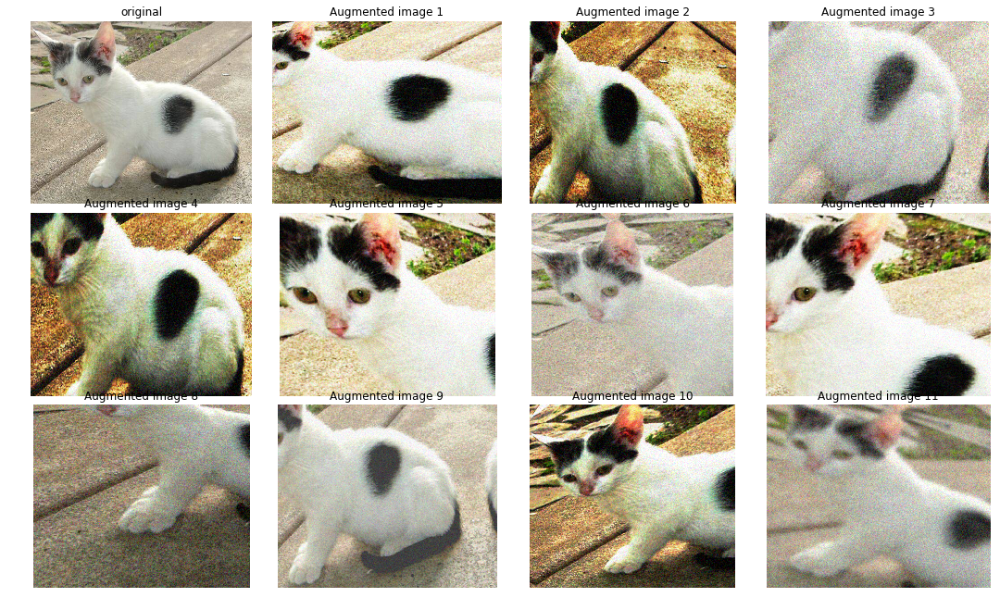

In [41]:
im = cat_3
Aug_im = [augment(im) for i in range(11)]
F = plt.figure(figsize=(15,10))
G = plt.GridSpec(3, 4, left=.01, right=.99, bottom=0.05, top=0.9, wspace=.01, hspace=0.05, figure=F)
ax = plt.subplot(G[0])
ax.imshow(im)
ax.set_axis_off()
ax.set_aspect('equal')
ax.set_title('original')
for i in range(1, 12):
    ax = plt.subplot(G[i])
    ax.imshow(Aug_im[i-1])
    ax.set_axis_off()
    ax.set_aspect('equal')
    ax.set_title(f'Augmented image {i}');

Now let's check out some augmentations of other training images

Text(0.5,1,'original')

Text(0.5,1,'Augmented image 1')

Text(0.5,1,'Augmented image 2')

Text(0.5,1,'Augmented image 3')

Text(0.5,1,'Augmented image 4')

Text(0.5,1,'Augmented image 5')

Text(0.5,1,'Augmented image 6')

Text(0.5,1,'Augmented image 7')

Text(0.5,1,'Augmented image 8')

Text(0.5,1,'Augmented image 9')

Text(0.5,1,'Augmented image 10')

Text(0.5,1,'Augmented image 11')

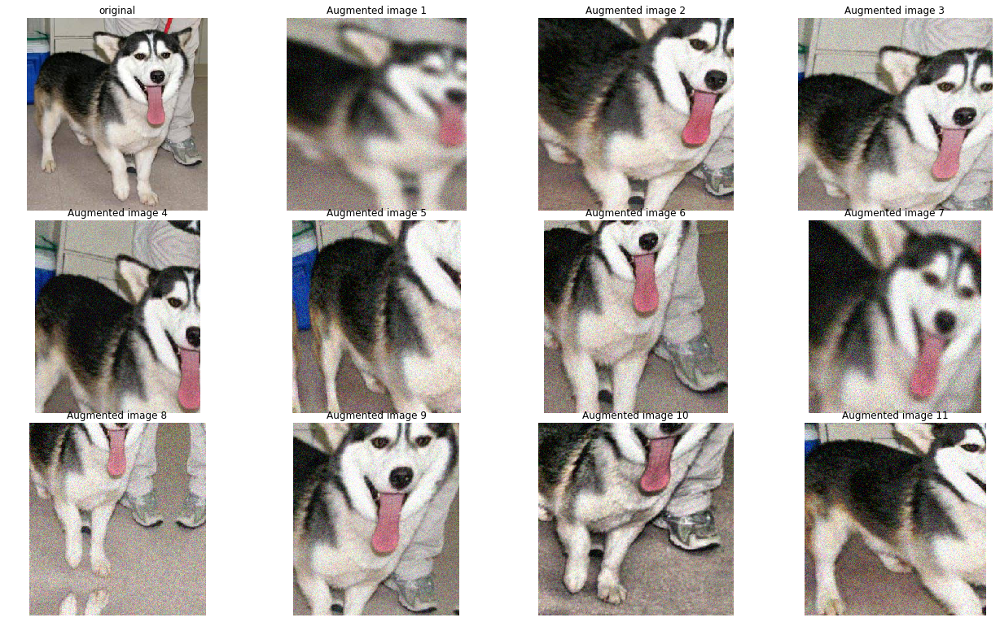

In [42]:
dog_1 = matplotlib.image.imread("C:/Users/1394852/Desktop/ml_project/dogs_cats/dog.12324.jpg")
im = dog_1
Aug_im = [augment(im) for i in range(11)]
F = plt.figure(figsize=(18,12))
G = plt.GridSpec(3, 4, left=.01, right=.99, bottom=0.05, top=0.9, wspace=.01, hspace=0.05, figure=F)
ax = plt.subplot(G[0])
ax.imshow(im)
ax.set_axis_off()
ax.set_aspect('equal')
ax.set_title('original')
for i in range(1, 12):
    ax = plt.subplot(G[i])
    ax.imshow(Aug_im[i-1])
    ax.set_axis_off()
    ax.set_aspect('equal')
    ax.set_title(f'Augmented image {i}');

Text(0.5,1,'original')

Text(0.5,1,'Augmented image 1')

Text(0.5,1,'Augmented image 2')

Text(0.5,1,'Augmented image 3')

Text(0.5,1,'Augmented image 4')

Text(0.5,1,'Augmented image 5')

Text(0.5,1,'Augmented image 6')

Text(0.5,1,'Augmented image 7')

Text(0.5,1,'Augmented image 8')

Text(0.5,1,'Augmented image 9')

Text(0.5,1,'Augmented image 10')

Text(0.5,1,'Augmented image 11')

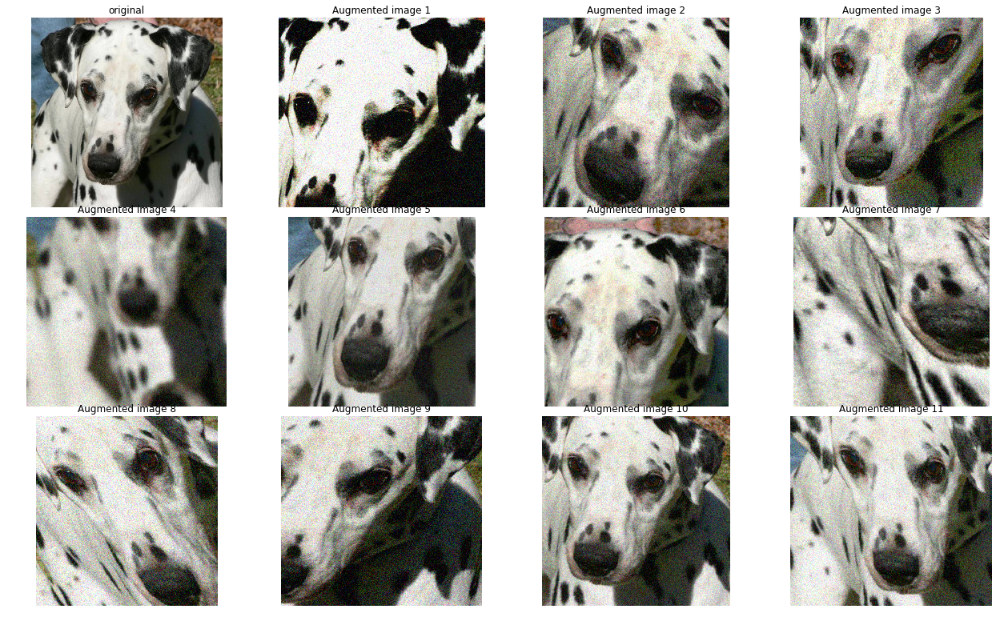

In [43]:
dog_2 = matplotlib.image.imread("C:/Users/1394852/Desktop/ml_project/dogs_cats/dog.11534.jpg")
im = dog_2
Aug_im = [augment(im) for i in range(11)]
F = plt.figure(figsize=(18,12))
G = plt.GridSpec(3, 4, left=.01, right=.99, bottom=0.05, top=0.9, wspace=.01, hspace=0.05, figure=F)
ax = plt.subplot(G[0])
ax.imshow(im)
ax.set_axis_off()
ax.set_aspect('equal')
ax.set_title('original')
for i in range(1, 12):
    ax = plt.subplot(G[i])
    ax.imshow(Aug_im[i-1])
    ax.set_axis_off()
    ax.set_aspect('equal')
    ax.set_title(f'Augmented image {i}');

A good approach would be to exclude some of the augmented images that seem unreasonable to add to our training set <br>
<br>
By tweaking the transformations and augmented image data we can likely improve the ability of our model to generalize to new test data, especially since these images have a lot of variance in terms of the backgrounds, camera perspectives, zoom, orientation, etc.

# Image Segmentation

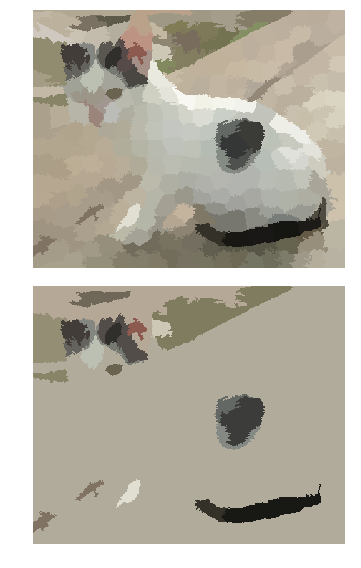

In [44]:
# Normalized cut method!!

from skimage import data, segmentation, color
from skimage.future import graph

img = cat_3

labels1 = segmentation.slic(img, compactness=10, n_segments=300)
out1 = color.label2rgb(labels1, img, kind='avg')

g = graph.rag_mean_color(img, labels1, mode='similarity')
labels2 = graph.cut_normalized(labels1, g)
out2 = color.label2rgb(labels2, img, kind='avg')

fig, ax = plt.subplots(nrows=2, sharex=True, sharey=True, figsize=(6, 8))

ax[0].imshow(out1)
ax[1].imshow(out2)

for a in ax:
    a.axis('off')

plt.tight_layout();

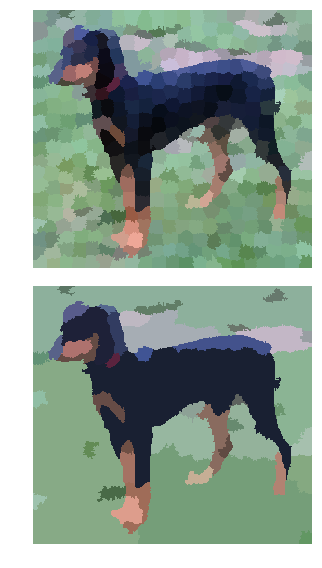

In [45]:
dog_3 = matplotlib.image.imread("C:/Users/1394852/Desktop/ml_project/dogs_cats/dog.12420.jpg")
img = dog_3

labels1 = segmentation.slic(img, compactness=30, n_segments=400)
out1 = color.label2rgb(labels1, img, kind='avg')

g = graph.rag_mean_color(img, labels1, mode='similarity')
labels2 = graph.cut_normalized(labels1, g)
out2 = color.label2rgb(labels2, img, kind='avg')

fig, ax = plt.subplots(nrows=2, sharex=True, sharey=True, figsize=(6, 8))

ax[0].imshow(out1)
ax[1].imshow(out2)

for a in ax:
    a.axis('off')

plt.tight_layout();

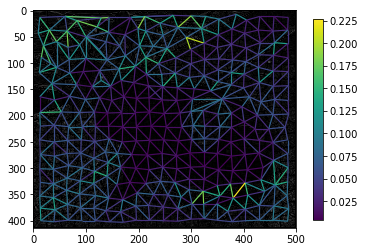

In [145]:
# Region adjacency graph

from skimage.future import graph
from skimage import data, segmentation, color, filters, io
from matplotlib import pyplot as plt

img = cat_3
gimg = color.rgb2gray(img)

labels = segmentation.slic(img, compactness=20, n_segments=300)
edges = filters.sobel(gimg)
edges_rgb = color.gray2rgb(edges)

g = graph.rag_boundary(labels, edges)
lc = graph.show_rag(labels, g, edges_rgb, img_cmap=None, edge_cmap='viridis',
                    edge_width=1.2)

plt.colorbar(lc, fraction=0.03)
io.show();

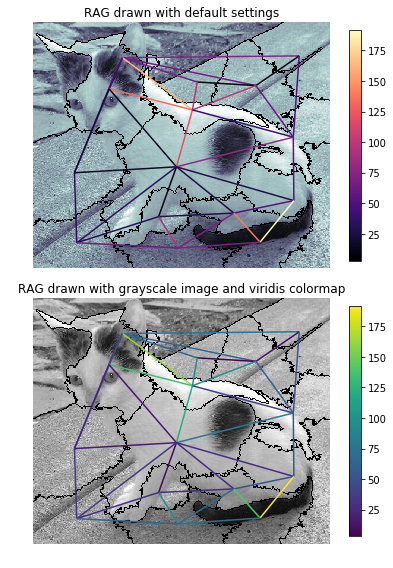

In [146]:
img = cat_3
labels = segmentation.slic(img, compactness=10, n_segments=20)
g = graph.rag_mean_color(img, labels)

fig, ax = plt.subplots(nrows=2, sharex=True, sharey=True, figsize=(6, 8))

ax[0].set_title('RAG drawn with default settings')
lc = graph.show_rag(labels, g, img, ax=ax[0])
# specify the fraction of the plot area that will be used to draw the colorbar
fig.colorbar(lc, fraction=0.03, ax=ax[0])

ax[1].set_title('RAG drawn with grayscale image and viridis colormap')
lc = graph.show_rag(labels, g, img,
                    img_cmap='gray', edge_cmap='viridis', ax=ax[1])
fig.colorbar(lc, fraction=0.03, ax=ax[1])

for a in ax:
    a.axis('off')

plt.tight_layout()
plt.show();

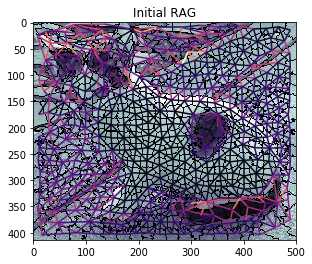

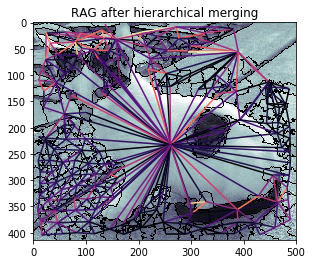

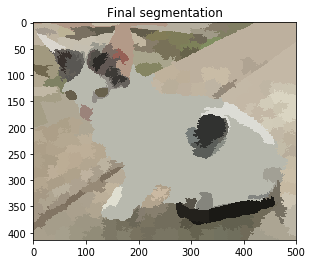

In [147]:
def weight_boundary(graph, src, dst, n):
    """
    Handle merging of nodes of a region boundary region adjacency graph.

    This function computes the `"weight"` and the count `"count"`
    attributes of the edge between `n` and the node formed after
    merging `src` and `dst`.


    Parameters
    ----------
    graph : RAG
        The graph under consideration.
    src, dst : int
        The vertices in `graph` to be merged.
    n : int
        A neighbor of `src` or `dst` or both.

    Returns
    -------
    data : dict
        A dictionary with the "weight" and "count" attributes to be
        assigned for the merged node.

    """
    default = {'weight': 0.0, 'count': 0}

    count_src = graph[src].get(n, default)['count']
    count_dst = graph[dst].get(n, default)['count']

    weight_src = graph[src].get(n, default)['weight']
    weight_dst = graph[dst].get(n, default)['weight']

    count = count_src + count_dst
    return {
        'count': count,
        'weight': (count_src * weight_src + count_dst * weight_dst)/count
    }


def merge_boundary(graph, src, dst):
    """Call back called before merging 2 nodes.

    In this case we don't need to do any computation here.
    """
    pass

img = cat_3
edges = filters.sobel(color.rgb2gray(img))
labels = segmentation.slic(img, compactness=10, n_segments=400)
g = graph.rag_boundary(labels, edges)

graph.show_rag(labels, g, img)
plt.title('Initial RAG')

labels2 = graph.merge_hierarchical(labels, g, thresh=0.04, rag_copy=False,
                                   in_place_merge=True,
                                   merge_func=merge_boundary,
                                   weight_func=weight_boundary)

graph.show_rag(labels, g, img)
plt.title('RAG after hierarchical merging')

plt.figure()
out = color.label2rgb(labels2, img, kind='avg')
plt.imshow(out)
plt.title('Final segmentation')

plt.show();

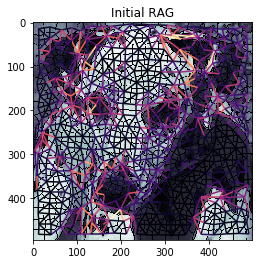

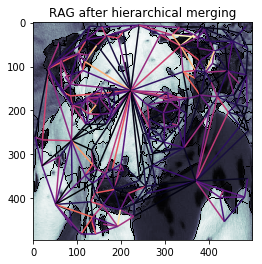

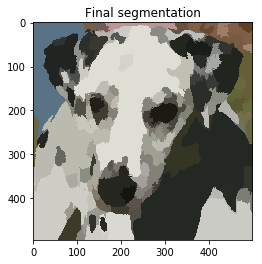

In [148]:
def weight_boundary(graph, src, dst, n):
    """
    Handle merging of nodes of a region boundary region adjacency graph.

    This function computes the `"weight"` and the count `"count"`
    attributes of the edge between `n` and the node formed after
    merging `src` and `dst`.


    Parameters
    ----------
    graph : RAG
        The graph under consideration.
    src, dst : int
        The vertices in `graph` to be merged.
    n : int
        A neighbor of `src` or `dst` or both.

    Returns
    -------
    data : dict
        A dictionary with the "weight" and "count" attributes to be
        assigned for the merged node.

    """
    default = {'weight': 0.0, 'count': 0}

    count_src = graph[src].get(n, default)['count']
    count_dst = graph[dst].get(n, default)['count']

    weight_src = graph[src].get(n, default)['weight']
    weight_dst = graph[dst].get(n, default)['weight']

    count = count_src + count_dst
    return {
        'count': count,
        'weight': (count_src * weight_src + count_dst * weight_dst)/count
    }


def merge_boundary(graph, src, dst):
    """Call back called before merging 2 nodes.

    In this case we don't need to do any computation here.
    """
    pass

img = dog_2
edges = filters.sobel(color.rgb2gray(img))
labels = segmentation.slic(img, compactness=20, n_segments=400)
g = graph.rag_boundary(labels, edges)

graph.show_rag(labels, g, img)
plt.title('Initial RAG')

labels2 = graph.merge_hierarchical(labels, g, thresh=0.04, rag_copy=False,
                                   in_place_merge=True,
                                   merge_func=merge_boundary,
                                   weight_func=weight_boundary)

graph.show_rag(labels, g, img)
plt.title('RAG after hierarchical merging')

plt.figure()
out = color.label2rgb(labels2, img, kind='avg')
plt.imshow(out)
plt.title('Final segmentation')

plt.show();

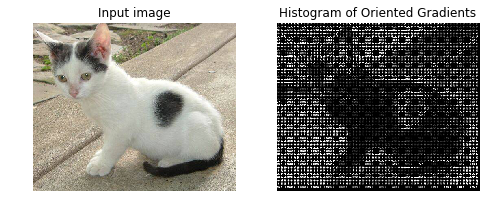

In [88]:
# Histogram of oriented gradients

from skimage.feature import hog
from skimage import data, exposure

image = cat_3

fd, hog_image = hog(image, orientations=9, pixels_per_cell=(8, 8),
                    cells_per_block=(3, 3), visualize=True, multichannel=True)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(image, cmap=plt.cm.gray)
ax1.set_title('Input image')

# Rescale histogram for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

ax2.axis('off')
ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax2.set_title('Histogram of Oriented Gradients')
plt.show();

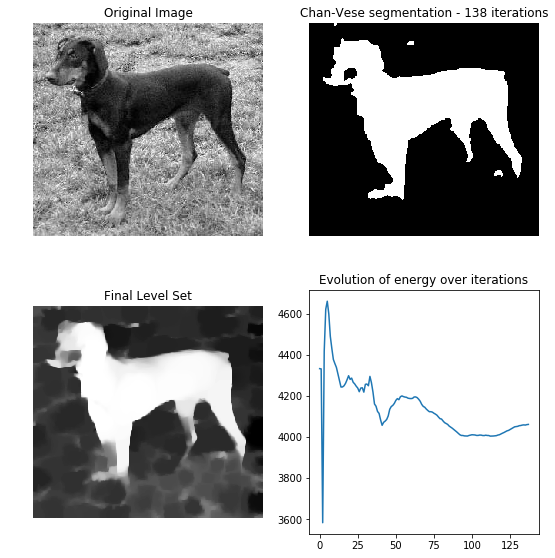

In [149]:
from skimage import data, img_as_float
from skimage.segmentation import chan_vese
import matplotlib.image as img

dog_1 = img.imread("C:/Users/1394852/Desktop/ml_project/dogs_cats/dog.12420.jpg")
dog_1 = cv2.cvtColor(dog_1, cv2.COLOR_BGR2GRAY)
image = img_as_float(dog_1)
# Feel free to play around with the parameters to see how they impact the result
cv = chan_vese(image, mu=0.25, lambda1=1, lambda2=1, tol=1e-3, max_iter=200,
               dt=0.5, init_level_set="checkerboard", extended_output=True)

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
ax = axes.flatten()

ax[0].imshow(image, cmap="gray")
ax[0].set_axis_off()
ax[0].set_title("Original Image", fontsize=12)

ax[1].imshow(cv[0], cmap="gray")
ax[1].set_axis_off()
title = "Chan-Vese segmentation - {} iterations".format(len(cv[2]))
ax[1].set_title(title, fontsize=12)

ax[2].imshow(cv[1], cmap="gray")
ax[2].set_axis_off()
ax[2].set_title("Final Level Set", fontsize=12)

ax[3].plot(cv[2])
ax[3].set_title("Evolution of energy over iterations", fontsize=12)

fig.tight_layout()
plt.show();

# More Image Processing and Feature Extraction

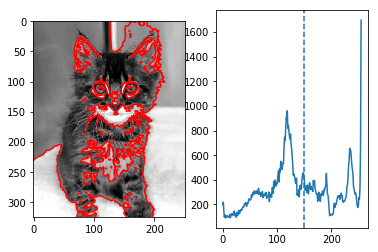

In [52]:
from skimage import data, exposure, filters
kitty = matplotlib.image.imread("C:/Users/1394852/Desktop/ml_project/dogs_cats/cat.7693.jpg")
kitty = cv2.cvtColor(kitty,cv2.COLOR_BGR2GRAY)

# histogram with counts of the images pixel intensities
hi = exposure.histogram(kitty)

# pixel intensity threshhold (color in with contour)
val = filters.threshold_otsu(kitty)

fig, axes = plt.subplots(1, 2);
axes[0].imshow(kitty, cmap='gray');
axes[0].contour(kitty, [val], colors='r');
axes[1].plot(hi[1], hi[0]);
axes[1].axvline(val, ls='--');

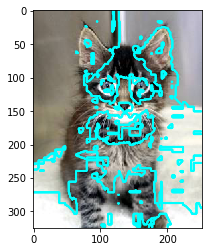

In [53]:
from skimage import io, color
kitty = matplotlib.image.imread("C:/Users/1394852/Desktop/ml_project/dogs_cats/cat.7693.jpg")

im = kitty
im_lab = color.rgb2lab(im)
data = np.array([im_lab[..., 1].ravel(), im_lab[..., 2].ravel()])

from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2, random_state=0).fit(data.T)
segmentation = kmeans.labels_.reshape(im.shape[:-1])

plt.imshow(im)
plt.contour(segmentation, colors='cyan');

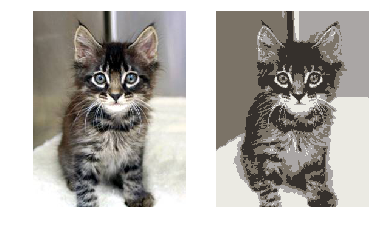

In [54]:
im = kitty
im_lab = color.rgb2lab(im)
data = np.array([im_lab[..., 0].ravel(),
                 im_lab[..., 1].ravel(),
                 im_lab[..., 2].ravel()])

kmeans = KMeans(n_clusters=4, random_state=0).fit(data.T)
segmentation = kmeans.labels_.reshape(im.shape[:-1])

color_mean = color.label2rgb(segmentation, im, kind='mean')
fig, axes = plt.subplots(1, 2);
axes[0].imshow(im);
axes[0].axis('off');
axes[1].imshow(color_mean);
axes[1].axis('off');

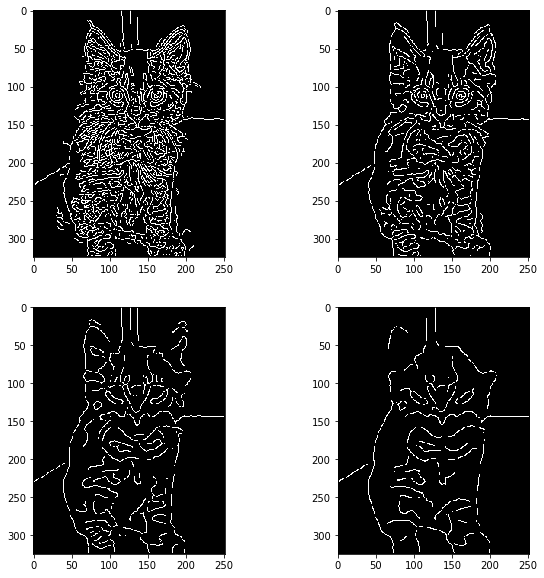

In [55]:
from skimage.feature import canny

im = color.rgb2gray(im)
edges = canny(im)
edges2 = canny(im, sigma = 2)
edges3 = canny(im, sigma = 3)
edges4 = canny(im, sigma = 4)


plt.figure(figsize=(10,10))
plt.subplot(2, 2, 1)
plt.imshow(edges, cmap=plt.cm.gray, interpolation='nearest')
plt.subplot(2, 2, 2)
plt.imshow(edges2, cmap=plt.cm.gray, interpolation='nearest')

plt.subplot(2, 2, 3)
plt.imshow(edges3, cmap=plt.cm.gray, interpolation='nearest')

plt.subplot(2, 2, 4)
plt.imshow(edges4, cmap=plt.cm.gray, interpolation='nearest')

plt.show();

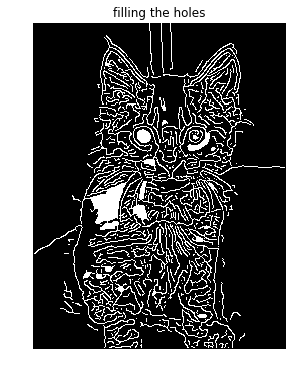

In [56]:
from scipy import ndimage as ndi

fill_cat = ndi.binary_fill_holes(edges)

fig, ax = plt.subplots(figsize=(7, 6))
ax.imshow(fill_cat, cmap=plt.cm.gray, interpolation='None')
ax.set_title('filling the holes')
ax.axis('off');

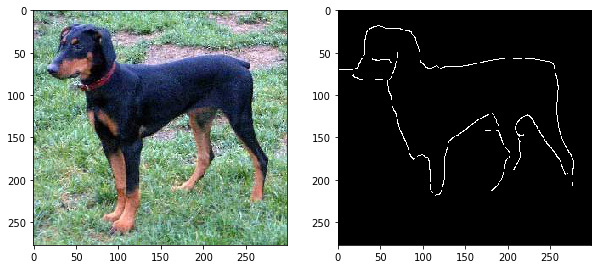

In [57]:
im = color.rgb2gray(dog_3)
edges = canny(im, sigma = 5)

plt.figure(figsize=(10,8))
plt.subplot(1, 2, 1)
plt.imshow(dog_3);

plt.subplot(1, 2, 2)
plt.imshow(edges, cmap=plt.cm.gray, interpolation='nearest');

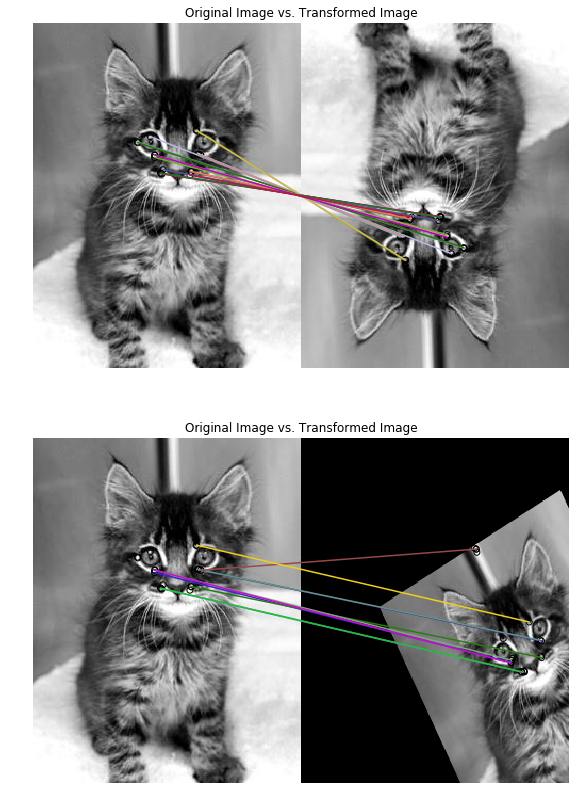

In [58]:
from skimage import data
from skimage import transform as tf
from skimage.feature import (match_descriptors, corner_harris,
                             corner_peaks, ORB, plot_matches)
from skimage.color import rgb2gray

img1 = rgb2gray(kitty)
img2 = tf.rotate(img1, 180)
tform = tf.AffineTransform(scale=(1.3, 1.1), rotation=0.5,
                           translation=(0, -200))
img3 = tf.warp(img1, tform)

descriptor_extractor = ORB(n_keypoints=20)

descriptor_extractor.detect_and_extract(img1)
keypoints1 = descriptor_extractor.keypoints
descriptors1 = descriptor_extractor.descriptors

descriptor_extractor.detect_and_extract(img2)
keypoints2 = descriptor_extractor.keypoints
descriptors2 = descriptor_extractor.descriptors

descriptor_extractor.detect_and_extract(img3)
keypoints3 = descriptor_extractor.keypoints
descriptors3 = descriptor_extractor.descriptors

matches12 = match_descriptors(descriptors1, descriptors2, cross_check=True)
matches13 = match_descriptors(descriptors1, descriptors3, cross_check=True)


fig, ax = plt.subplots(nrows=2, ncols=1)
fig.set_figwidth(14)
fig.set_figheight(14)

plt.gray()

plot_matches(ax[0], img1, img2, keypoints1, keypoints2, matches12)
ax[0].axis('off')
ax[0].set_title("Original Image vs. Transformed Image")

plot_matches(ax[1], img1, img3, keypoints1, keypoints3, matches13)
ax[1].axis('off')
ax[1].set_title("Original Image vs. Transformed Image");

# Anomaly/Outlier Detection

In [229]:
from sklearn.neighbors import LocalOutlierFactor
X_dogs = np.array([x for x in data[24000:]])
X_dogs = X_dogs.reshape(1000, 16384)
clf = LocalOutlierFactor(n_neighbors=20, n_jobs=-1, contamination = 0.1)
y_pred = clf.fit_predict(X_dogs)

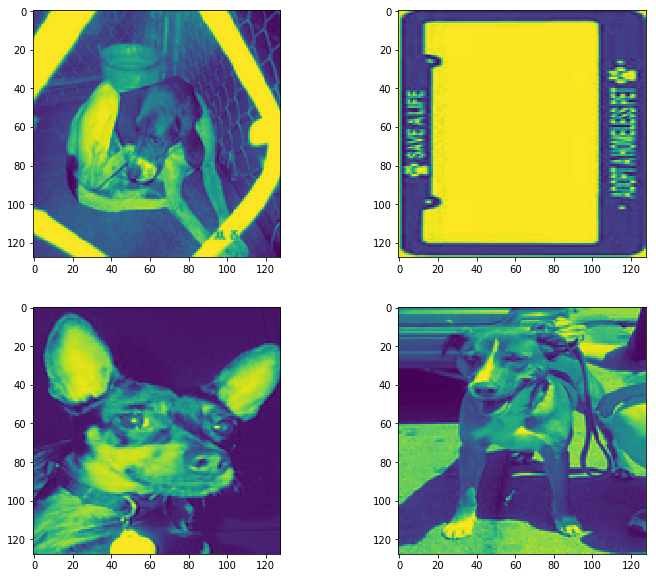

In [230]:
# FOUND SOME OUTLIERS!!
X_scores = clf.negative_outlier_factor_
out1 = np.sort(X_scores)[:5][0]
out2 = np.sort(X_scores)[:5][1]
out3 = np.sort(X_scores)[:5][2]
out4 = np.sort(X_scores)[:5][3]

plt.figure(figsize = (12, 10))
plt.subplot(2, 2, 1)
plt.imshow(X_dogs[X_scores == out1].reshape(128, 128))
plt.subplot(2, 2, 2)
plt.imshow(X_dogs[X_scores == out2].reshape(128, 128))
plt.subplot(2, 2, 3)
plt.imshow(X_dogs[X_scores == out3].reshape(128, 128))
plt.subplot(2, 2, 4)
plt.imshow(X_dogs[X_scores == out4].reshape(128, 128));

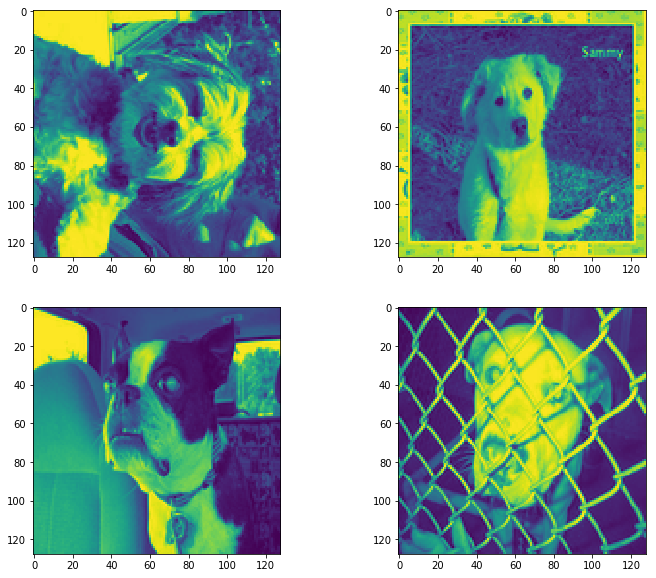

In [231]:
out1 = np.sort(X_scores)[4]
out2 = np.sort(X_scores)[5]
out3 = np.sort(X_scores)[6]
out4 = np.sort(X_scores)[7]

plt.figure(figsize = (12, 10))
plt.subplot(2, 2, 1)
plt.imshow(X_dogs[X_scores == out1].reshape(128, 128))
plt.subplot(2, 2, 2)
plt.imshow(X_dogs[X_scores == out2].reshape(128, 128))
plt.subplot(2, 2, 3)
plt.imshow(X_dogs[X_scores == out3].reshape(128, 128))
plt.subplot(2, 2, 4)
plt.imshow(X_dogs[X_scores == out4].reshape(128, 128));

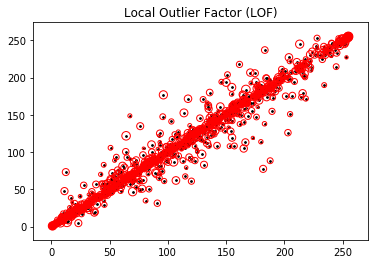

In [304]:
plt.title("Local Outlier Factor (LOF)")
plt.scatter(X_dogs[:, 0], X_dogs[:, 1], color='k', s=3., label='Data points')
# plot circles with radius proportional to the outlier scores
radius = (X_scores.max() - X_scores) / (X_scores.max() - X_scores.min())
plt.scatter(X_dogs[:, 0], X_dogs[:, 1], s=100 * radius, edgecolors='r',
            facecolors='none', label='Outlier scores');

In [64]:
from sklearn.ensemble import IsolationForest
labels = train_data[:,1]
data = train_data[:,0]

X_dogs = np.array([x for x in data[12500:]])
X_dogs = X_dogs.reshape(12500, 16384)
clf = IsolationForest(behaviour='new', random_state=9, contamination='auto', n_jobs = -1, n_estimators=40)
clf.fit(X_dogs)

IsolationForest(behaviour='new', bootstrap=False, contamination='auto',
        max_features=1.0, max_samples='auto', n_estimators=40, n_jobs=-1,
        random_state=9, verbose=0)

In [65]:
X_scores = clf.score_samples(X_dogs)

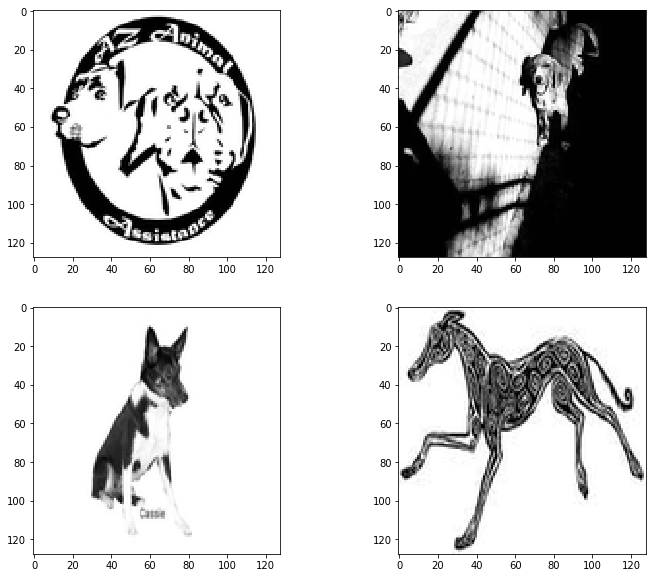

In [66]:
out1 = np.sort(X_scores)[0]
out2 = np.sort(X_scores)[1]
out3 = np.sort(X_scores)[2]
out4 = np.sort(X_scores)[3]

plt.figure(figsize = (12, 10))
plt.subplot(2, 2, 1)
plt.imshow(X_dogs[X_scores == out1].reshape(128, 128))
plt.subplot(2, 2, 2)
plt.imshow(X_dogs[X_scores == out2].reshape(128, 128))
plt.subplot(2, 2, 3)
plt.imshow(X_dogs[X_scores == out3].reshape(128, 128))
plt.subplot(2, 2, 4)
plt.imshow(X_dogs[X_scores == out4].reshape(128, 128));

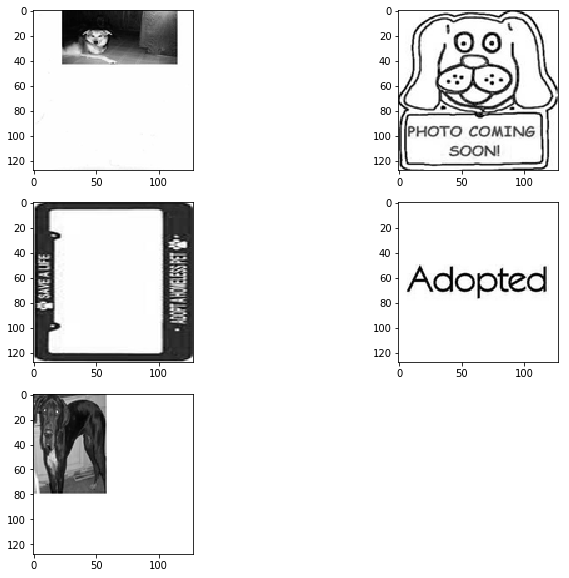

In [67]:
out1 = np.sort(X_scores)[4]
out2 = np.sort(X_scores)[5]
out3 = np.sort(X_scores)[6]
out4 = np.sort(X_scores)[7]
out5 = np.sort(X_scores)[8]

plt.figure(figsize = (12, 10))
plt.subplot(3, 2, 1)
plt.imshow(X_dogs[X_scores == out1].reshape(128, 128))
plt.subplot(3, 2, 2)
plt.imshow(X_dogs[X_scores == out2].reshape(128, 128))
plt.subplot(3, 2, 3)
plt.imshow(X_dogs[X_scores == out3].reshape(128, 128))
plt.subplot(3, 2, 4)
plt.imshow(X_dogs[X_scores == out4].reshape(128, 128))
plt.subplot(3, 2, 5)
plt.imshow(X_dogs[X_scores == out5].reshape(128, 128));

In [69]:
# remove outliers from training data
X_dogs = X_dogs[X_scores > np.sort(X_scores)[8]]


IndexError: boolean index did not match indexed array along dimension 0; dimension is 12491 but corresponding boolean dimension is 12500

In [71]:
from sklearn.ensemble import IsolationForest

X_cats = np.array([x for x in data[:12500]])
X_cats = X_cats.reshape(12500, 16384)
clf = IsolationForest(behaviour='new', random_state=9, contamination='auto', n_jobs = -1, n_estimators=50)
clf.fit(X_cats)

IsolationForest(behaviour='new', bootstrap=False, contamination='auto',
        max_features=1.0, max_samples='auto', n_estimators=50, n_jobs=-1,
        random_state=9, verbose=0)

In [72]:
X_scores = clf.score_samples(X_cats)

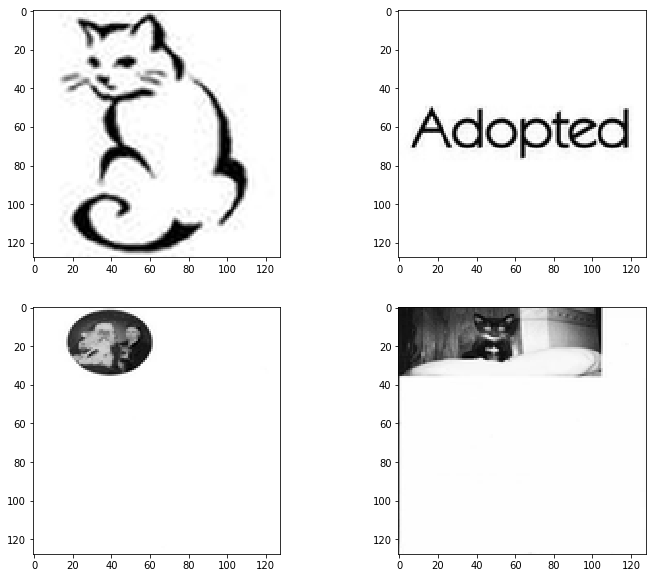

In [73]:
out1 = np.sort(X_scores)[0]
out2 = np.sort(X_scores)[1]
out3 = np.sort(X_scores)[2]
out4 = np.sort(X_scores)[3]

plt.figure(figsize = (12, 10))
plt.subplot(2, 2, 1)
plt.imshow(X_cats[X_scores == out1].reshape(128, 128))
plt.subplot(2, 2, 2)
plt.imshow(X_cats[X_scores == out2].reshape(128, 128))
plt.subplot(2, 2, 3)
plt.imshow(X_cats[X_scores == out3].reshape(128, 128))
plt.subplot(2, 2, 4)
plt.imshow(X_cats[X_scores == out4].reshape(128, 128));

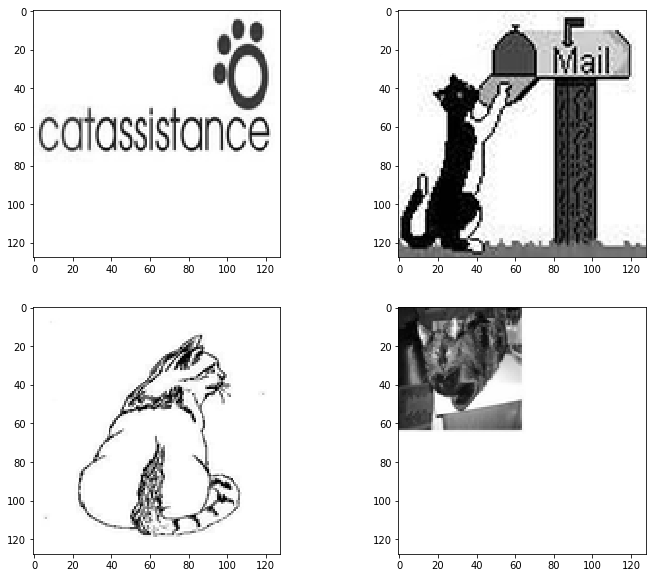

In [74]:
out1 = np.sort(X_scores)[4]
out2 = np.sort(X_scores)[5]
out3 = np.sort(X_scores)[6]
out4 = np.sort(X_scores)[7]

plt.figure(figsize = (12, 10))
plt.subplot(2, 2, 1)
plt.imshow(X_cats[X_scores == out1].reshape(128, 128))
plt.subplot(2, 2, 2)
plt.imshow(X_cats[X_scores == out2].reshape(128, 128))
plt.subplot(2, 2, 3)
plt.imshow(X_cats[X_scores == out3].reshape(128, 128))
plt.subplot(2, 2, 4)
plt.imshow(X_cats[X_scores == out4].reshape(128, 128));

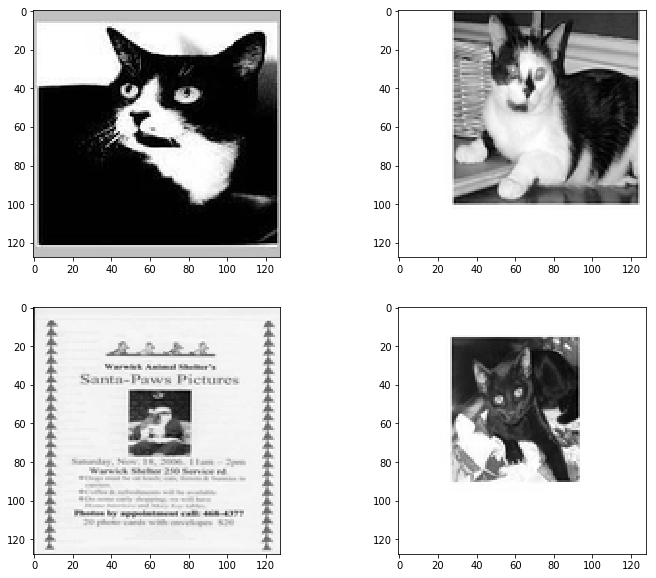

In [75]:
out1 = np.sort(X_scores)[8]
out2 = np.sort(X_scores)[9]
out3 = np.sort(X_scores)[10]
out4 = np.sort(X_scores)[11]

plt.figure(figsize = (12, 10))
plt.subplot(2, 2, 1)
plt.imshow(X_cats[X_scores == out1].reshape(128, 128))
plt.subplot(2, 2, 2)
plt.imshow(X_cats[X_scores == out2].reshape(128, 128))
plt.subplot(2, 2, 3)
plt.imshow(X_cats[X_scores == out3].reshape(128, 128))
plt.subplot(2, 2, 4)
plt.imshow(X_cats[X_scores == out4].reshape(128, 128));

In [76]:
# remove outliers from training data
X_cats = X_cats[X_scores > np.sort(X_scores)[7]]

# Extract Features

In [158]:
edges2 = canny(im, sigma = 2)
X_canny = np.array([canny(x.reshape(128, 128), sigma=2).reshape(16384) for x in X])
X_canny.shape

(24983, 16384)

In [ ]:
# data augmentation
aug_im = [augment(im) for i in range(11)]

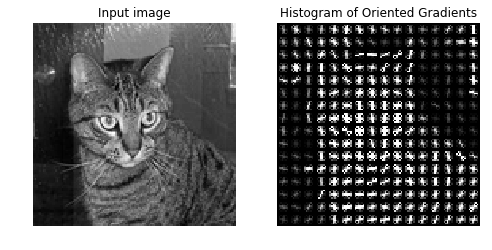

In [89]:
# Histogram of oriented gradients
from skimage.feature import hog
from skimage import data, color, exposure

image = X[1].reshape(128, 128)

fd, hog_image = hog(image, orientations=24, pixels_per_cell=(8, 8),
                    cells_per_block=(1, 1), visualize=True)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(image, cmap=plt.cm.gray)
ax1.set_title('Input image')

# Rescale histogram for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

ax2.axis('off')
ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax2.set_title('Histogram of Oriented Gradients')
plt.show();

In [98]:
X = np.vstack((X_cats, X_dogs))
X.shape

(24983, 16384)

In [99]:
X = np.array([hog(x.reshape(128, 128), orientations=24, 
                  pixels_per_cell=(8, 8),
                  cells_per_block=(1, 1), 
                  feature_vector = True, 
                  transform_sqrt = True) for x in X])